In [ ]:
!pip install ultralytics
!git clone https://github.com/ultralytics/ultralytics.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.8/882.8 kB 48.5 MB/s eta 0:00:00
Cloning into 'ultralytics'...
remote: Enumerating objects: 43510, done.
remote: Counting objects: 100% (1099/1099), done.
remote: Compressing objects: 100% (714/714), done.
remote: Total 43510 (delta 661), reused 709 (delta 378), pack-reused 42411 (from 1)
Receiving objects: 100% (43510/43510), 32.84 MiB | 16.50 MiB/s, done.
Resolving deltas: 100% (32159/32159), done.


In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.5 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.7/112.6 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xxxxxxxxxxxxxxxxxxxxxx")
project = rf.workspace("technic").project("waste-classification2-hqwuf")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to waste-classification2-1 in yolov11:: 100%|██████████| 2480/2480 [00:00<00:00, 4472.62it/s]


In [ ]:
dataset.location

'/content/waste-classification2-1'

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=100 imgsz=640

100% 5.35M/5.35M [00:00<00:00, 227MB/s]
Ultralytics 8.3.5 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/waste-classification2-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

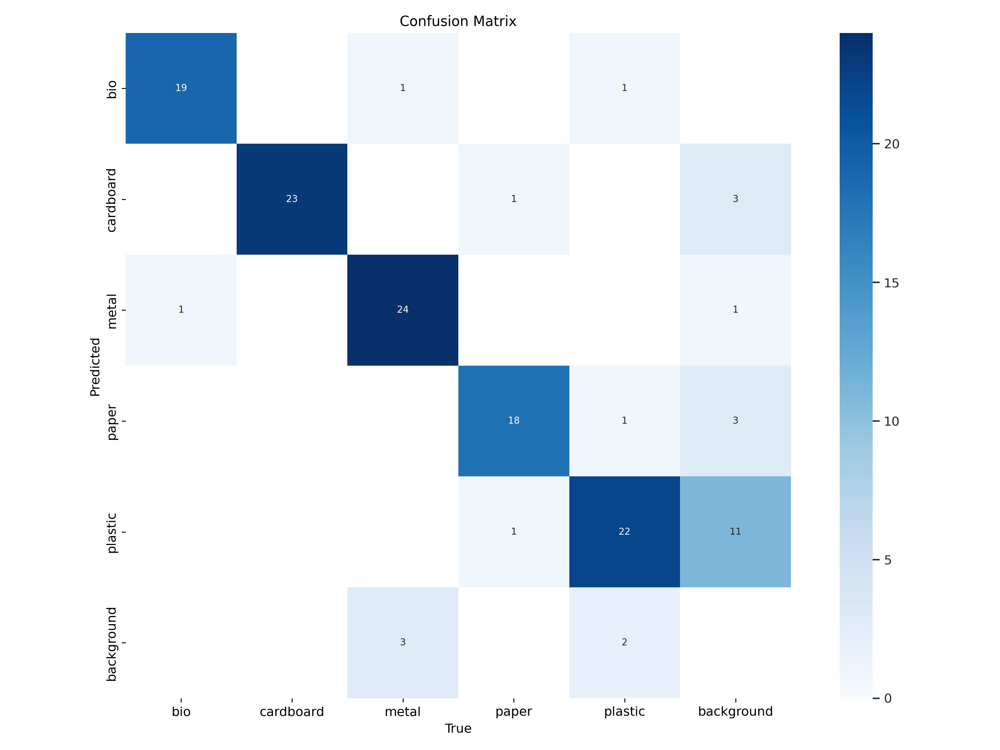

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

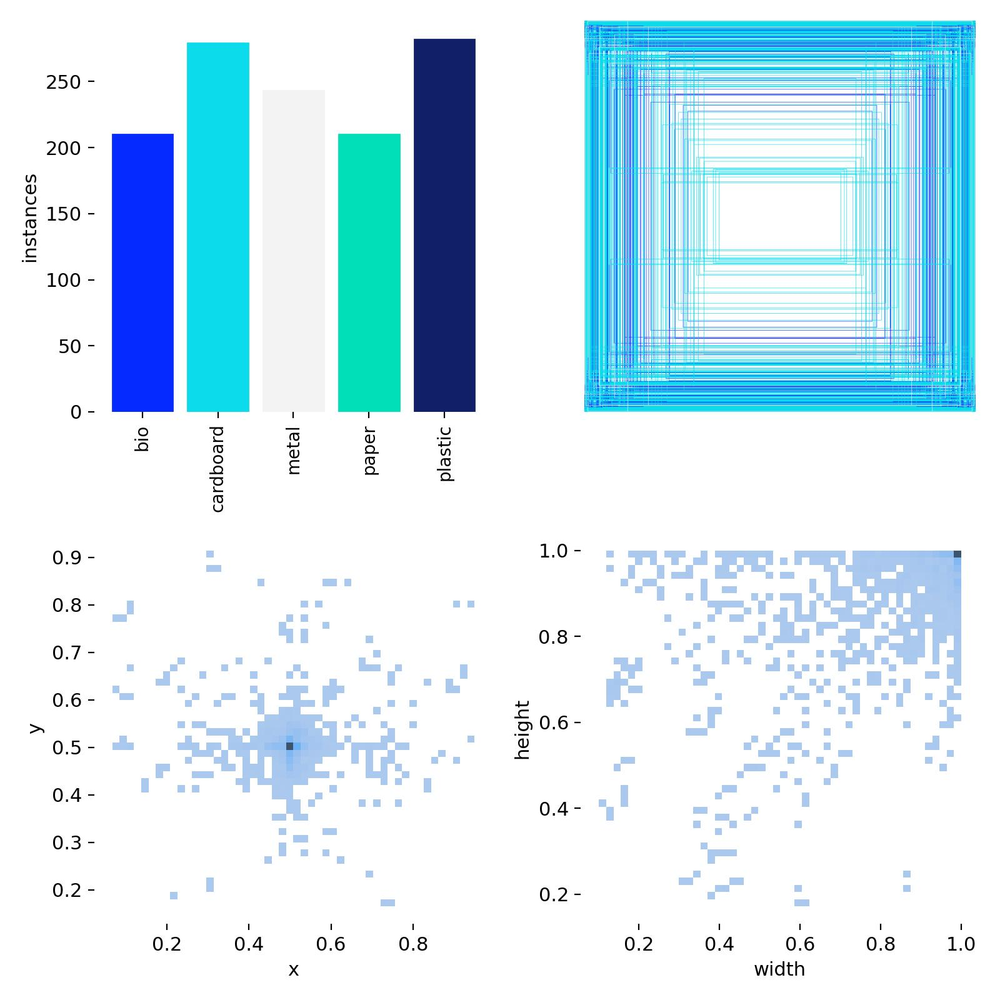

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

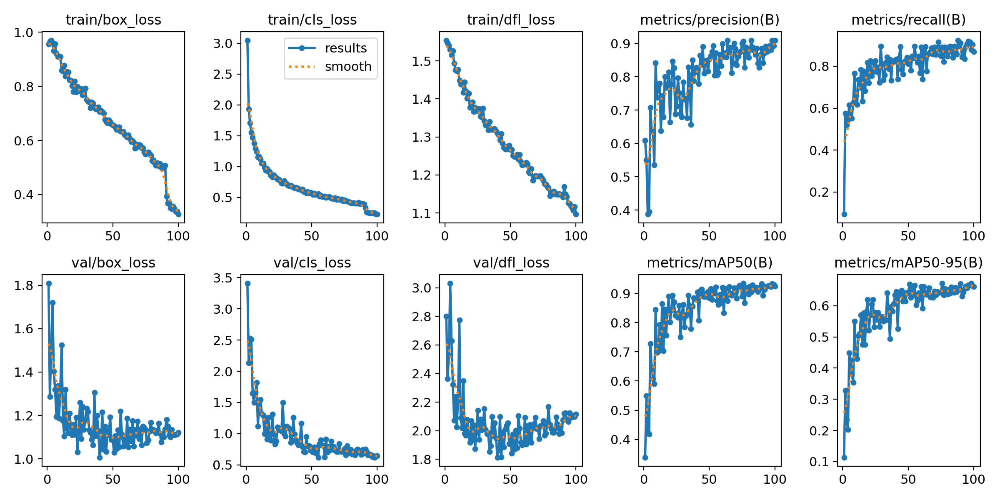

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

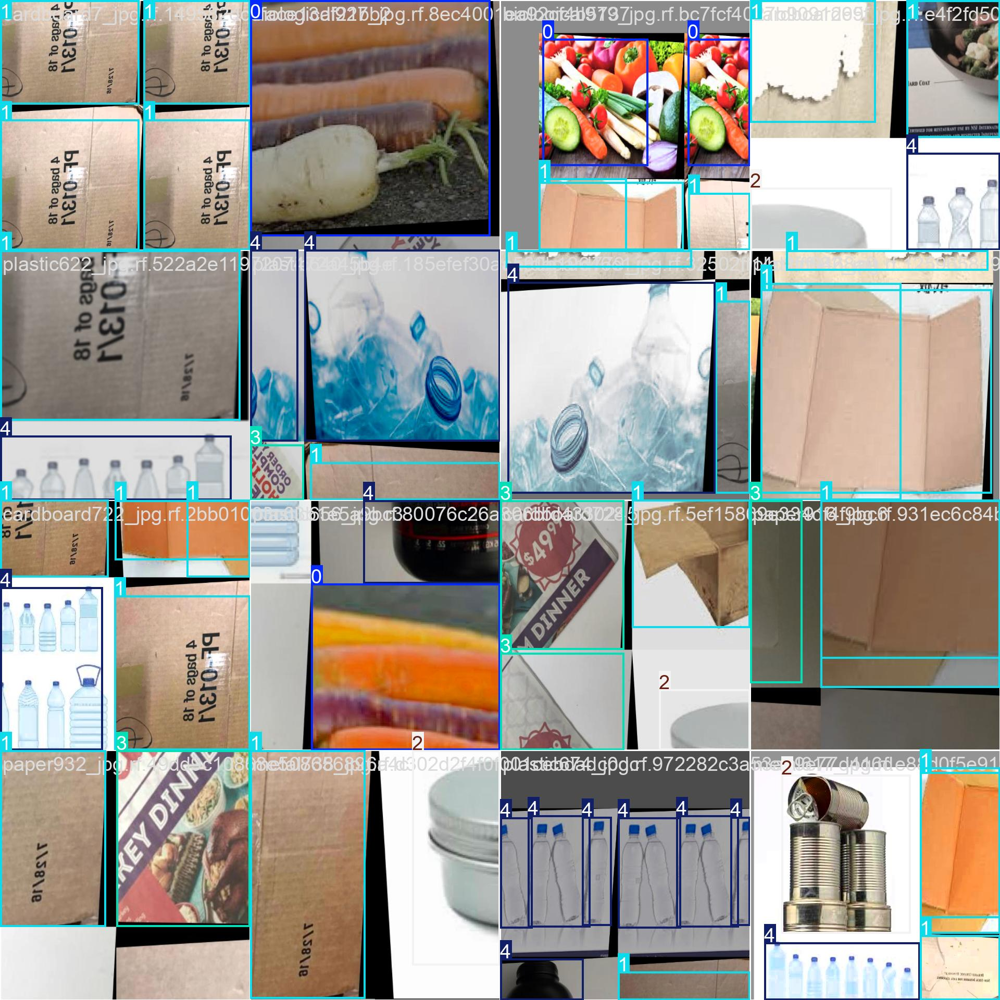

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

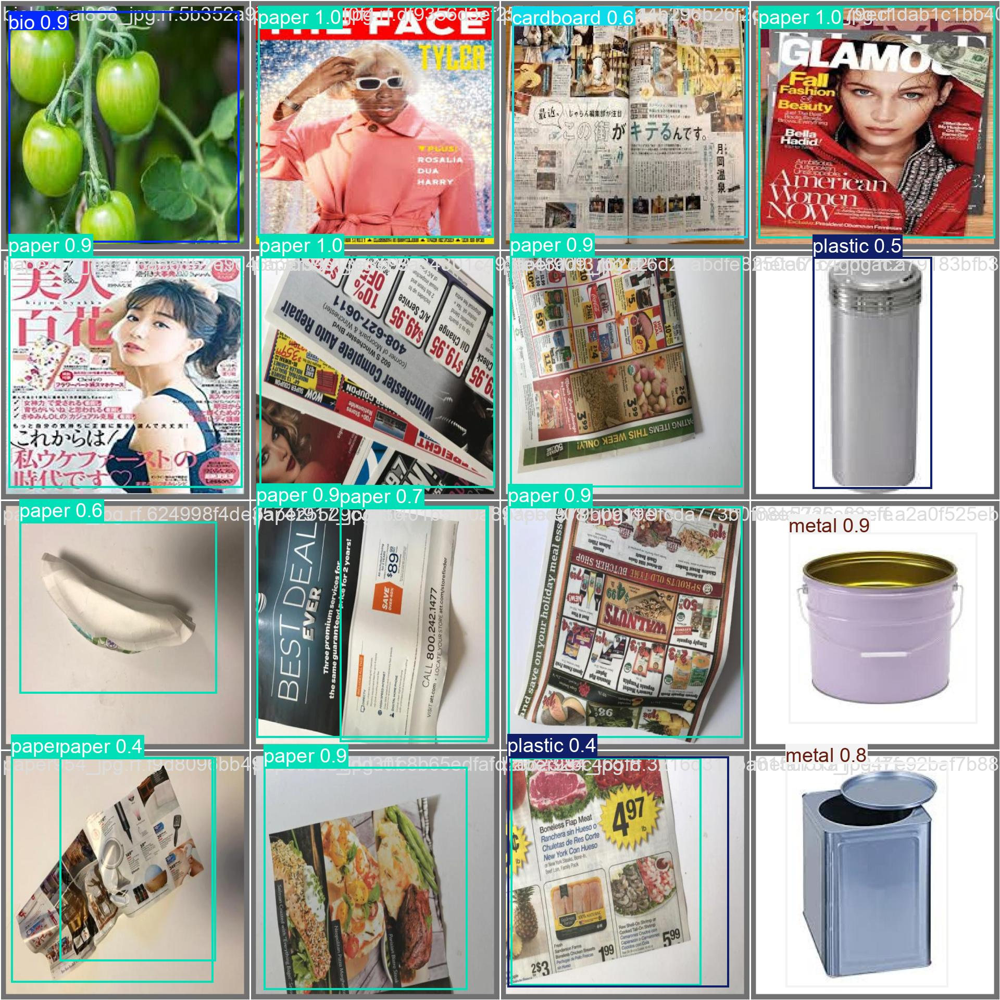

In [ ]:

Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

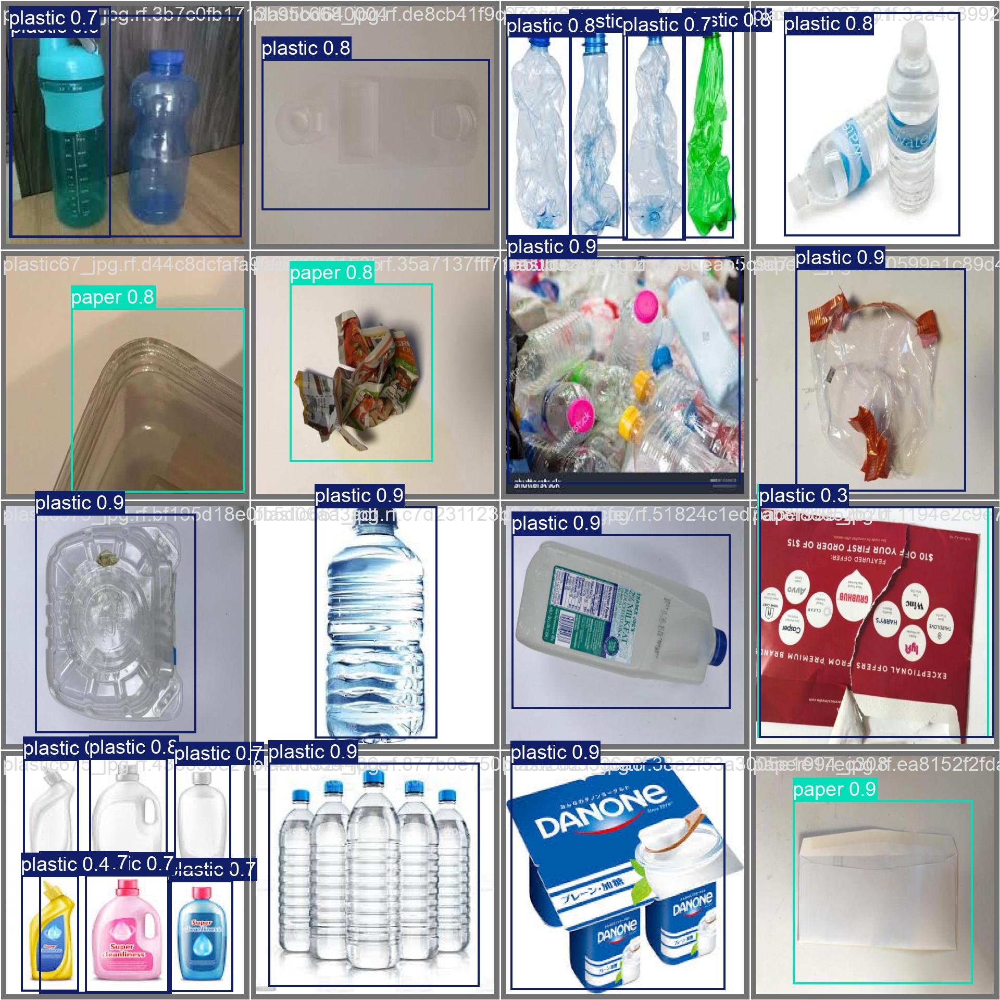

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

In [ ]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.5 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/waste-classification2-1/valid/labels.cache... 103 images, 0 backgrounds, 0 corrupt: 100% 103/103 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:03<00:00,  2.24it/s]
                   all        103        117      0.907       0.89      0.935      0.674
                   bio         20         20      0.932       0.95      0.988      0.743
             cardboard         22         23      0.964      0.957      0.989      0.752
                 metal         21         28      0.957      0.821      0.923      0.593
                 paper         20         20      0.898      0.878      0.951      0.693
               plastic         20         26      0.785      0.846      0.821      0.588
Speed: 3.8ms preprocess, 6.2ms inference,

In [ ]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.5 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs

image 1/51 /content/waste-classification2-1/test/images/biological891_jpg.rf.cc807fd30258fde9435e1443626a8f13.jpg: 640x640 1 bio, 19.4ms
image 2/51 /content/waste-classification2-1/test/images/biological90_jpg.rf.67f09bfd778a0c357acdc6a51db5f93c.jpg: 640x640 1 bio, 14.6ms
image 3/51 /content/waste-classification2-1/test/images/biological914_jpg.rf.843d14160380d14955bdc370cee4c592.jpg: 640x640 1 bio, 13.7ms
image 4/51 /content/waste-classification2-1/test/images/biological915_jpg.rf.fbadb7db27aa2c9b2b09010119395b70.jpg: 640x640 1 bio, 13.4ms
image 5/51 /content/waste-classification2-1/test/images/biological916_jpg.rf.eeee1eae5a49b16bd6eb728a7a8f3ca3.jpg: 640x640 1 bio, 13.2ms
image 6/51 /content/waste-classification2-1/test/images/biological937_jpg.rf.e4ecd75cc9b9bbc7c55bf0d1ef9126e4.jpg: 640x640 1 bio, 14.3ms
image 7/51 /co

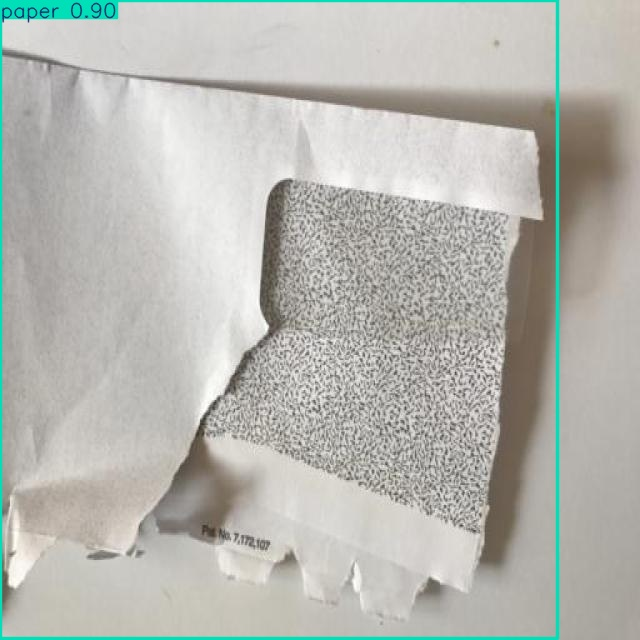

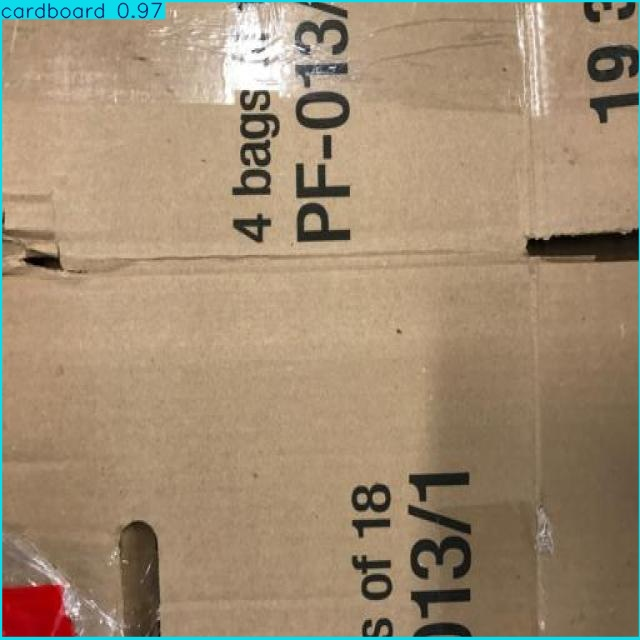

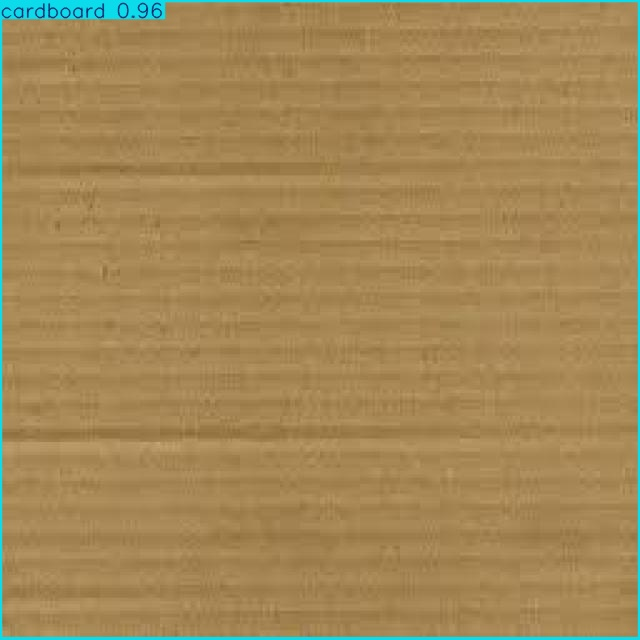

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [19]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source="WIN_20241002_14_57_16_Pro.mp4" save=True

Ultralytics 8.3.5 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 44.3ms
video 1/1 (frame 2/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 13.3ms
video 1/1 (frame 3/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 11.9ms
video 1/1 (frame 4/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 14.4ms
video 1/1 (frame 5/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 12.0ms
video 1/1 (frame 6/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 10.8ms
video 1/1 (frame 7/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 13.0ms
video 1/1 (frame 8/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 10.2ms
video 1/1 (frame 9/571) /content/WIN_20241002_14_57_16_Pro.mp4: 384x640 1 paper, 8.6ms
video 1/1 (frame 10/571) /content/WIN_202410

In [23]:
from IPython.display import HTML
from base64 import b64encode
import os

save_path = '/content/runs/detect/predict2/WIN_20241002_14_57_16_Pro.avi'

compressed_path = "/content/drive/MyDrive/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#The code was changed to include a placeholder '%s' within the HTML template string.
#The old-style formatting operator '%' was then used to insert the data_url variable into the placeholder.